# Multicolinearity

On the _Potential Problems_ section 3.3.3, of [Introduction to Statistical Learning](http://www-bcf.usc.edu/~gareth/ISL/), the authors talk about _Colinearity_:

> Since collinearity reduces the accuracy of the estimates of the regression coefficients, it causes the standard error for βˆj to grow. Recall that the t-statistic for each predictor is calculated by dividing βˆj by its standard error. Consequently, collinearity results in a decline in the t-statistic.

According to this, colinear predictors cause standard errors of the coefficients to increase. Let's see if we can confirm this with the `Credit` dataset.

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import plot, iplot, init_notebook_mode
init_notebook_mode()

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [12]:
data = pd.read_csv('../../datasets/Credit.csv')

We'll try to predict `Balance` using two models, one with non-colinear predictors (`Age` and `Limit`) and another with colinear predictors (`Rating` and `Limit`).

Let's see how these features relate:

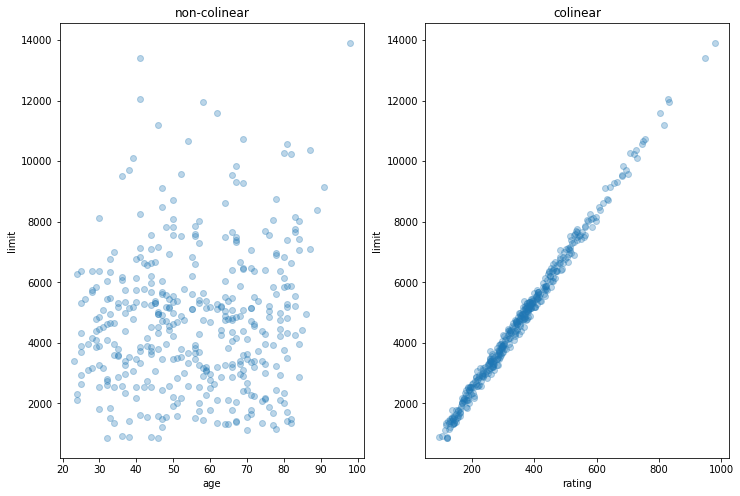

In [13]:
_, (ax, ax2) = plt.subplots(1, 2, figsize=(12, 8))

ax.scatter(data.Age, data.Limit, alpha=0.3)
ax.set_xlabel('age')
ax.set_ylabel('limit')
ax.set_title('non-colinear')

ax2.scatter(data.Rating, data.Limit, alpha=0.3)
ax2.set_xlabel('rating')
ax2.set_ylabel('limit')
ax2.set_title('colinear');

We'll fit two models now, trying to predict `Balance`

In [14]:
model = sm.OLS(data.Balance, sm.add_constant(data[['Age', 'Limit']])).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                Balance   R-squared:                       0.750
Model:                            OLS   Adj. R-squared:                  0.749
Method:                 Least Squares   F-statistic:                     595.0
Date:                Thu, 16 Aug 2018   Prob (F-statistic):          3.52e-120
Time:                        00:22:52   Log-Likelihood:                -2742.2
No. Observations:                 400   AIC:                             5490.
Df Residuals:                     397   BIC:                             5502.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -173.4109     43.828     -3.957      0.000    -259.576     -87.246
Age           -2.2915      0.672     -3.407      0.001      -3.614      -0.969
Limit          0.1734      0.005     34.496      0.000       0.163       0.183
==============================================================================
Omnibus:                       19.180   Durbin-Watson:                   1.951
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               27.162
Skew:                           0.382   Prob(JB):                     1.26e-06
Kurtosis:                       4.022   Cond. No.                     2.00e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large,  2e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [15]:
model_2 = sm.OLS(data.Balance, sm.add_constant(data[['Rating', 'Limit']])).fit()
model_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                Balance   R-squared:                       0.746
Model:                            OLS   Adj. R-squared:                  0.745
Method:                 Least Squares   F-statistic:                     582.8
Date:                Thu, 16 Aug 2018   Prob (F-statistic):          7.57e-119
Time:                        00:22:52   Log-Likelihood:                -2745.3
No. Observations:                 400   AIC:                             5497.
Df Residuals:                     397   BIC:                             5509.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -377.5368     45.254     -8.343      0.000    -466.505    -288.569
Rating         2.2017      0.952      2.312      0.021       0.330       4.074
Limit          0.0245      0.064      0.384      0.701      -0.101       0.150
==============================================================================
Omnibus:                       23.153   Durbin-Watson:                   1.964
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               38.187
Skew:                           0.394   Prob(JB):                     5.10e-09
Kurtosis:                       4.293   Cond. No.                     2.06e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.06e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

We confirm that standard errors are larger on the colinear model. Not only that but `Limit` standard error increased a lot, making the predictor non-significant (the interval is so large that includes zero).

Let's see how these models look on 3 axes:

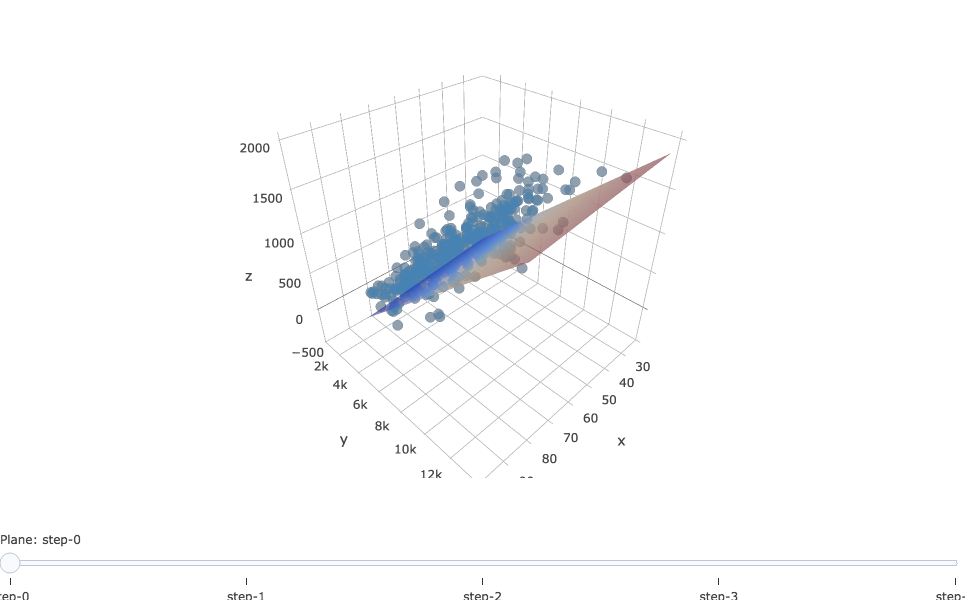

In [16]:

def _plane(x, y, b0, b1, b2):
    _x = np.arange(min(x), max(x), 20)
    _y = np.arange(min(y), max(y), 20)
    xx, yy = np.meshgrid(_x, _y, sparse=True)
    z = b0 + (b1 * xx) + (b2 * yy)
    return _x, _y, z


marker = {
    'color': 'steelblue',
    'size':6,
    'line':{
        'color': 'steelblue',
        'width': 0.25,
    },
    'opacity': 0.5
}

errs = np.array([43.828, 0.672, 0.005])
err_scales = np.array([[-2, -1, 0, 1, 2]])
n_scales = err_scales.shape[1]

steps = []
for i in range(n_scales):
    step = dict(
        method = 'restyle',  
        args = ['visible', [False] * (n_scales + 1)],
    )
    step['args'][1][0] = True
    step['args'][1][i+1] = True
    steps.append(step)

sliders = [dict(
    active = 10,
    currentvalue = {"prefix": "Plane: "},
    pad = {"t": 50},
    steps = steps
)]


layout = go.Layout(margin={'l': 0, 'r': 0, 'b': 0, 't': 25}, height=600, width=800, sliders=sliders)

ps = []

for i in range(n_scales):
    xr, yr, zr = (errs * err_scales.T)[i]
    x, y, z = _plane(data.Age, data.Limit, b0=-173.41+xr, b1=-2.29+yr, b2=0.17+zr)
    plane = go.Surface(x=x, y=y, z=z, opacity=0.7, showscale=False, visible=(i==0))
    ps.append(plane)
series = go.Scatter3d(x=data.Age, y=data.Limit, z=data.Balance, mode='markers', marker=marker)

iplot({'data': [series] + ps , 'layout': layout})

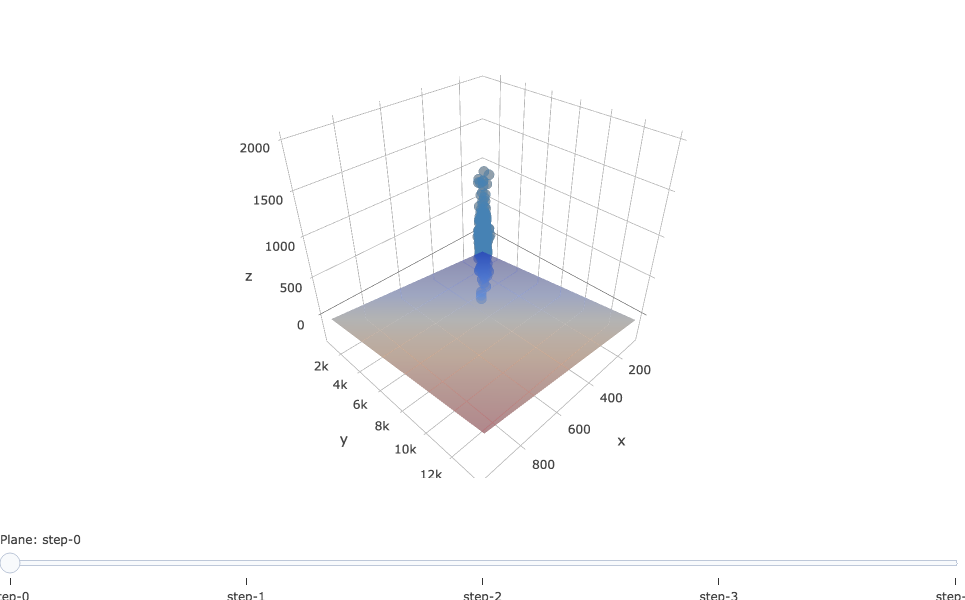

In [24]:
errs = np.array([0.952, 0.064])
err_scales = np.array([[-2, -1, 0, 1, 2]])
n_scales = err_scales.shape[1]
steps = []

for i in range(n_scales):
    step = dict(
        method = 'restyle',  
        args = ['visible', [False] * (n_scales + 1) ],
    )
    step['args'][1][0] = True
    step['args'][1][i+1] = True
    steps.append(step)

sliders = [dict(
    active = 10,
    currentvalue = {"prefix": "Plane: "},
    pad = {"t": 50},
    steps = steps
)]


layout = go.Layout(margin={'l': 0, 'r': 0, 'b': 0, 't': 25}, height=600, width=800, sliders=sliders)

ps = []

for i in range(n_scales):
    xr, yr = (errs * err_scales.T)[i]
    x, y, z = _plane(data.Rating, data.Limit, b0=-377.53, b1=2.20+xr, b2=0.02)
    plane = go.Surface(x=x, y=y, z=z, opacity=0.7, showscale=False, visible=(i==0))
    ps.append(plane)
    
series = go.Scatter3d(x=data.Rating, y=data.Limit, z=data.Balance, mode='markers', marker=marker)
iplot({'data': [series] + ps, 'layout': layout})

In [25]:
marker = {
    'size':6,
    'line':{
        'color': 'steelblue',
        'width': 0.5,
    },
    'opacity': 0.5
}

layout = go.Layout(margin={'l': 0, 'r': 0, 'b': 0, 't': 25}, height=600, width=800)
series = go.Scatter3d(x=data.Age, y=data.Limit, z=data.Balance, mode='markers', marker=marker)

z1 = np.array([
    [10, 10, 10, 10],
    [12, 12, 12, 12,],
    [15, 15, 15, 15],
])


xs = np.linspace(min(data.Age), max(data.Age))
ys = np.linspace(min(data.Limit), max(data.Limit))
zs = xs * 2 + ys * 2

sfc = go.Surface(x=xs, y=ys, z=zs, opacity=0.5)
iplot({'data': [sfc], 'layout': layout})
